## Conformal Prediction

In [1]:
%load_ext autoreload
%autoreload 2
import sys
import os

sys.path.append(os.path.abspath(os.path.join('..')))
sys.path.append(os.path.abspath(os.path.join('..', 'src')))
import matplotlib.pyplot as plt
import scienceplots


plt.style.use(['science', 'ieee']) 

In [45]:
from dataset import Cub2011Dataset, create_dataloaders
from torch.utils.data import Dataset, DataLoader
import torch
from sklearn.metrics import confusion_matrix
import seaborn as sns
import numpy as np
import pandas as pd
from tqdm.autonotebook import tqdm
import torch.nn.functional as F
from torchvision.transforms import v2 as transforms
from pl_module import LitResNet
from eval_utils import *


import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from captum.attr import LayerGradCam, GuidedBackprop

# Custom modules
from dataset import Cub2011Dataset, create_dataloaders
from cp_utils import *
from vis_utils import visualize_and_save_case, visualize_multi_level
from eval_utils import run_ser_experiment, evaluate_class_coverage, evaluate_baselines

device='cuda'

In [46]:
MEAN = [0.485, 0.456, 0.406]
STD = [0.229, 0.224, 0.225]
IMAGE_SIZE = 448 

train_transform = transforms.Compose([
    transforms.Resize((IMAGE_SIZE, IMAGE_SIZE)),
    transforms.TrivialAugmentWide(), 
    transforms.ToTensor(),
    transforms.Normalize(MEAN, STD)
])


uncropped_transform = transforms.Compose([
    transforms.Resize((448, 448)),
    transforms.ToTensor(),
    transforms.Normalize(MEAN, STD)
])


test_transform = transforms.Compose([
    transforms.Resize((IMAGE_SIZE, IMAGE_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize(MEAN, STD)
])

/home/cpsc4710_us79/.local/lib/python3.10/site-packages/torchvision/transforms/v2/_deprecated.py:42: UserWarning: The transform `ToTensor()` is deprecated and will be removed in a future release. Instead, please use `v2.Compose([v2.ToImage(), v2.ToDtype(torch.float32, scale=True)])`.Output is equivalent up to float precision.
  warnings.warn(


In [ ]:
from sklearn.model_selection import train_test_split
from torch.utils.data import Subset

CUB_ROOT = '../data/CUB_200_2011/'
BATCH_SIZE = 64


train_loader, test_loader = create_dataloaders(
    root_dir=CUB_ROOT,
    train_transform=train_transform,
    test_transform=test_transform,
    batch_size=BATCH_SIZE,
    use_bbox=True,
    ret_bbox=False,
    num_workers=10
)


train_dataset = train_loader.dataset
test_dataset_full = test_loader.dataset 
class_names = train_dataset.class_names

# Load Model
model = LitResNet.load_from_checkpoint(
    checkpoint_path='/home/cpsc4710_us79/project_cpsc4710/cpsc4710_us79/Project/results/checkpoints/resnet50-notebook-full-ft-2025-11-20T13:24:21/best-epoch=17.ckpt',
)
device = 'cuda'
model.to(device)


exp_dataset_full = Cub2011Dataset(
    root_dir=CUB_ROOT, 
    train=False, 
    transform=uncropped_transform,  
    use_bbox=False,                 
    return_bbox=True               
)


# Get labels for stratification
targets = [label for _, label, _ in test_dataset_full.samples]
all_indices = np.arange(len(test_dataset_full))

# Split indices (50% Cal / 50% Test)
cal_indices, eval_indices = train_test_split(
    all_indices,
    test_size=0.5,
    stratify=targets, 
    random_state=42
)

cal_dataset = Subset(test_dataset_full, cal_indices)
test_dataset_new = Subset(test_dataset_full, eval_indices)
exp_dataset_new = Subset(exp_dataset_full, eval_indices)

print(f"Original Test Size: {len(test_dataset_full)}")
print(f"Calibration Size:   {len(cal_dataset)}")
print(f"Evaluation Size:    {len(test_dataset_new)} (Cropped & Uncropped Synced)")

cal_loader = DataLoader(cal_dataset, batch_size=BATCH_SIZE, shuffle=False, drop_last=True)
test_loader_new = DataLoader(test_dataset_new, batch_size=BATCH_SIZE, shuffle=False)

Original Test Size: 5794
Calibration Size:   2897
Evaluation Size:    2897 (Cropped & Uncropped Synced)


### Conformal Predictor Calibration and Eval

In [48]:
from torchcp.classification.score import APS, LAC, EntmaxScore
from torchcp.classification.predictor import SplitPredictor, ClassConditionalPredictor, RC3PPredictor

#### Finding the best predictor and score function

In [13]:
import torch
import pandas as pd
from tqdm.auto import tqdm

alphas = [0.05, 0.1, 0.2]
score_instances = [APS(), LAC(), EntmaxScore()]
predictor_classes = [SplitPredictor, ClassConditionalPredictor, RC3PPredictor]

evaluation_results = {}
for alpha in tqdm(alphas, desc="Alphas", position=0):
    for score_fn in tqdm(score_instances, desc=f"Scores (alpha={alpha})", leave=False, position=1):
        for predictor_cls in predictor_classes:
            score_name = score_fn.__class__.__name__
            pred_name = predictor_cls.__name__
            print(f'({pred_name}, {score_name})')
            try:
                predictor = get_predictor(model, predictor_cls, score_fn, device=device)
                calibrate_predictor(predictor, cal_loader, alpha)
                metrics = eval_predictor(predictor, test_loader_new)
                print(metrics)
                evaluation_results[(alpha, score_name, pred_name)] = metrics
                
            except Exception as e:
                tqdm.write(f"  ! Failed for Alpha={alpha}, {score_name}, {pred_name}: {e}")

tqdm.write(f"\nCompleted. Collected {len(evaluation_results)} results.")

Alphas:   0%|          | 0/3 [00:00<?, ?it/s]

(SplitPredictor, APS)
{'coverage_rate': 0.9382119178771973, 'average_size': 2.759061098098755}
(ClassConditionalPredictor, APS)


/home/cpsc4710_us79/.local/lib/python3.10/site-packages/torchcp/utils/common.py:70: UserWarning: The value of quantile exceeds 1. It should be a value in [0,1]. To avoid program crash, the threshold is set as inf.
  warnings.warn(


{'coverage_rate': 1.0, 'average_size': 200.0}
(RC3PPredictor, APS)


{'coverage_rate': 0.9530549049377441, 'average_size': 8.791163444519043}
(SplitPredictor, LAC)
{'coverage_rate': 0.936486005783081, 'average_size': 1.8743528127670288}
(ClassConditionalPredictor, LAC)
{'coverage_rate': 1.0, 'average_size': 200.0}
(RC3PPredictor, LAC)


{'coverage_rate': 0.9530549049377441, 'average_size': 8.791163444519043}
(SplitPredictor, EntmaxScore)
{'coverage_rate': 0.9420089721679688, 'average_size': 1.9223334789276123}
(ClassConditionalPredictor, EntmaxScore)
{'coverage_rate': 1.0, 'average_size': 200.0}
(RC3PPredictor, EntmaxScore)


Alphas:  33%|███▎      | 1/3 [06:17<12:34, 377.12s/it]

{'coverage_rate': 0.9530549049377441, 'average_size': 8.791163444519043}


(SplitPredictor, APS)
{'coverage_rate': 0.8805661201477051, 'average_size': 1.7690714597702026}
(ClassConditionalPredictor, APS)
{'coverage_rate': 0.9264756441116333, 'average_size': 9.576112747192383}
(RC3PPredictor, APS)


{'coverage_rate': 0.9030030965805054, 'average_size': 2.5008628368377686}
(SplitPredictor, LAC)
{'coverage_rate': 0.8871245980262756, 'average_size': 1.1908870935440063}
(ClassConditionalPredictor, LAC)
{'coverage_rate': 0.9278563857078552, 'average_size': 8.92405891418457}
(RC3PPredictor, LAC)


{'coverage_rate': 0.9036934971809387, 'average_size': 2.4836037158966064}
(SplitPredictor, EntmaxScore)
{'coverage_rate': 0.8888505101203918, 'average_size': 1.2181566953659058}
(ClassConditionalPredictor, EntmaxScore)
{'coverage_rate': 0.9420089721679688, 'average_size': 9.479806900024414}
(RC3PPredictor, EntmaxScore)


Alphas:  67%|██████▋   | 2/3 [12:31<06:15, 375.47s/it]

{'coverage_rate': 0.915774941444397, 'average_size': 2.586123466491699}


(SplitPredictor, APS)
{'coverage_rate': 0.797721803188324, 'average_size': 1.2682085037231445}
(ClassConditionalPredictor, APS)
{'coverage_rate': 0.7949603199958801, 'average_size': 1.6341042518615723}
(RC3PPredictor, APS)


{'coverage_rate': 0.8270624876022339, 'average_size': 1.435623049736023}
(SplitPredictor, LAC)
{'coverage_rate': 0.7904729247093201, 'average_size': 0.8722816705703735}
(ClassConditionalPredictor, LAC)
{'coverage_rate': 0.8056610226631165, 'average_size': 1.2623403072357178}
(RC3PPredictor, LAC)


{'coverage_rate': 0.8363824486732483, 'average_size': 1.4245771169662476}
(SplitPredictor, EntmaxScore)
{'coverage_rate': 0.8412150740623474, 'average_size': 1.0}
(ClassConditionalPredictor, EntmaxScore)
{'coverage_rate': 0.8829823732376099, 'average_size': 1.4490852355957031}
(RC3PPredictor, EntmaxScore)


Alphas: 100%|██████████| 3/3 [18:46<00:00, 375.62s/it]

{'coverage_rate': 0.8919572234153748, 'average_size': 1.6289265155792236}

Completed. Collected 27 results.


In [14]:
import pandas as pd

data = []

for (alpha, score_name, pred_name), metrics in evaluation_results.items():
    row = {
        "Alpha": alpha,
        "Score_Function": score_name,
        "Predictor": pred_name
    }
    
    for k, v in metrics.items():
        if hasattr(v, 'item'):
            row[k] = v.item()
        else:
            row[k] = v
            
    data.append(row)

df = pd.DataFrame(data)
df.to_csv("../results/conformal_results.csv", index=False)

print("Saved table to conformal_results.csv")
print(df.head())

Saved table to conformal_results.csv
   Alpha Score_Function                  Predictor  coverage_rate  \
0   0.05            APS             SplitPredictor       0.938212   
1   0.05            APS  ClassConditionalPredictor       1.000000   
2   0.05            APS              RC3PPredictor       0.953055   
3   0.05            LAC             SplitPredictor       0.936486   
4   0.05            LAC  ClassConditionalPredictor       1.000000   

   average_size  
0      2.759061  
1    200.000000  
2      8.791163  
3      1.874353  
4    200.000000  


In [16]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

def load_and_prep_data(filepath):
    """
    Loads the CSV and adds a 'Target Coverage' column for easier plotting.
    """
    df = pd.read_csv(filepath)
    df["Target_Coverage"] = 1 - df["Alpha"]
    return df

def plot_efficiency_curve(df, predictor_type="SplitPredictor"):
    """
    ../results/../results/plots Efficiency (Set Size) vs. Target Coverage.
    Focuses on a specific predictor to compare Score Functions.
    """
    plt.figure(figsize=(7, 5))
    
    subset = df[df["Predictor"] == predictor_type]
    
    sns.lineplot(
        data=subset, 
        x="Target_Coverage", 
        y="average_size", 
        hue="Score_Function", 
        style="Score_Function", 
        markers=True, 
        dashes=False,
        linewidth=2,
        palette="viridis"
    )
    
    plt.title(f"Efficiency Curve: {predictor_type}\n(Lower is Better)", fontsize=14)
    plt.xlabel("Target Coverage ($1-\\alpha$)", fontsize=12)
    plt.ylabel("Average Set Size", fontsize=12)
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.tight_layout()
    
    plt.savefig(f"../results/../results/../results/plots/efficiency_curve_{predictor_type}.png", dpi=300)
    plt.show()

def plot_calibration_curve(df, predictor_type="SplitPredictor"):
    """
    ../results/plots Validity (Empirical Coverage) vs. Target Coverage.
    Checks if the model is delivering the promised coverage.
    """
    plt.figure(figsize=(7, 5))
    
    subset = df[df["Predictor"] == predictor_type]
    
    sns.lineplot(
        data=subset, 
        x="Target_Coverage", 
        y="coverage_rate", 
        hue="Score_Function", 
        style="Score_Function", 
        markers=True, 
        linewidth=2
    )
    
    min_val = df["Target_Coverage"].min()
    max_val = df["Target_Coverage"].max()
    plt.plot([min_val, max_val], [min_val, max_val], 'k--', label="Ideal (y=x)", alpha=0.5)
    
    plt.title(f"Calibration Plot: {predictor_type}\n(Closer to Diagonal is Better)", fontsize=14)
    plt.xlabel("Target Coverage ($1-\\alpha$)", fontsize=12)
    plt.ylabel("Empirical Coverage Rate", fontsize=12)
    plt.legend(title="Score Function")
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.tight_layout()
    
    plt.savefig(f"../results/plots/calibration_curve_{predictor_type}.png", dpi=300)
    plt.show()

def plot_method_comparison_bar(df, target_alpha=0.1):
    """
    Bar chart comparing all Predictors and Score Functions at a specific Alpha.
    Useful for the 'Ablation Studies' section.
    """
    plt.figure(figsize=(10, 6))
    
    subset = df[df["Alpha"] == target_alpha]
    
    bar_plot = sns.barplot(
        data=subset, 
        x="Predictor", 
        y="average_size", 
        hue="Score_Function", 
        palette="viridis",
        edgecolor="black"
    )
    
    cov = int((1- target_alpha) * 100)
    plt.title(f"Method Comparison at $\\alpha={target_alpha}$ ({cov}% Coverage)", fontsize=14)
    plt.ylabel("Average Set Size (Lower is Better)", fontsize=12)
    plt.xlabel("Predictor / Calibration Method", fontsize=12)
    plt.legend(title="Score Function", bbox_to_anchor=(1.05, 1), loc='upper left')
    
    for container in bar_plot.containers:
        bar_plot.bar_label(container, fmt='%.1f', padding=3)

    plt.tight_layout()
    plt.savefig(f"../results/plots/method_comparison_alpha_{target_alpha}.png", dpi=300)
    plt.show()



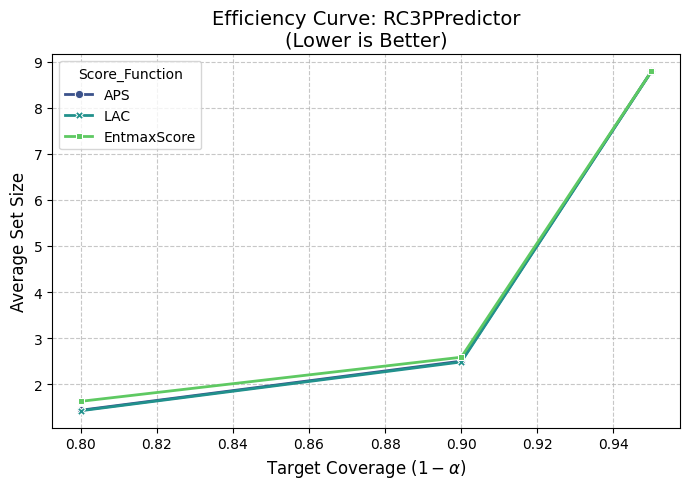

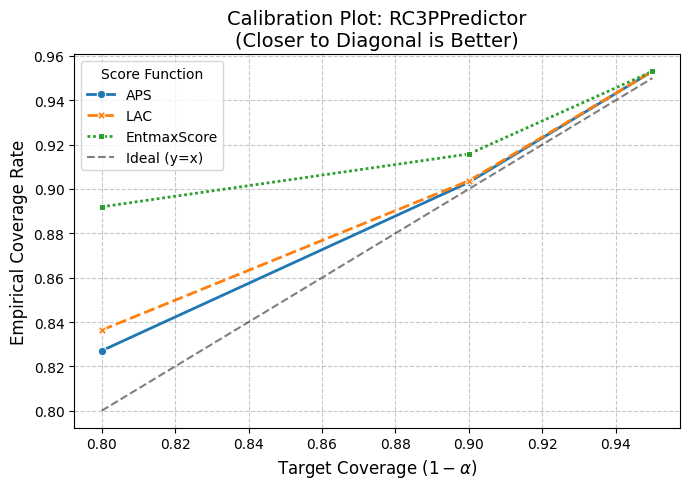

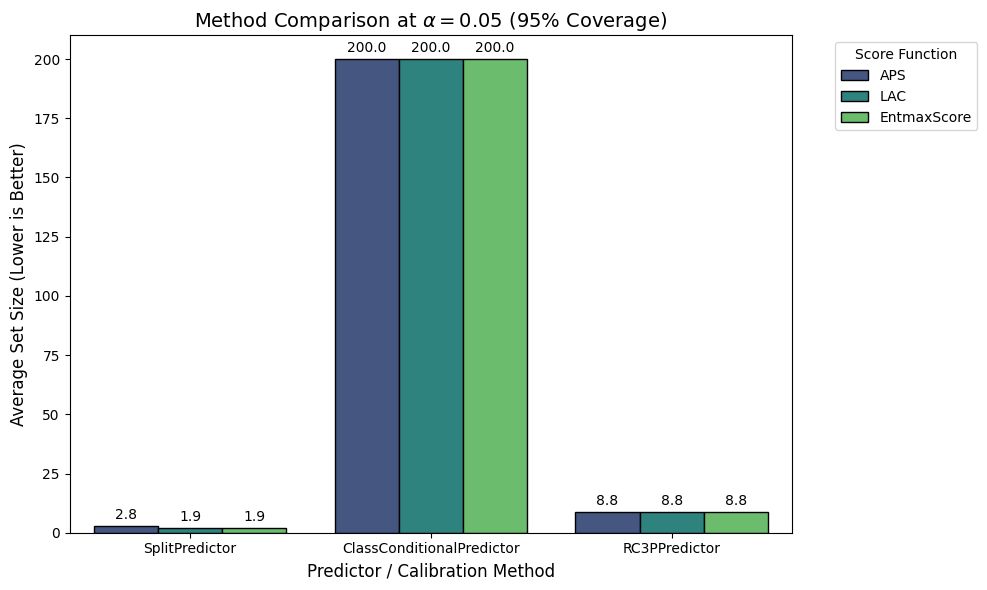

In [20]:
df = load_and_prep_data("../results/conformal_results.csv")

plot_efficiency_curve(df, predictor_type="RC3PPredictor")
plot_calibration_curve(df, predictor_type="RC3PPredictor")
plot_method_comparison_bar(df, target_alpha=0.05)

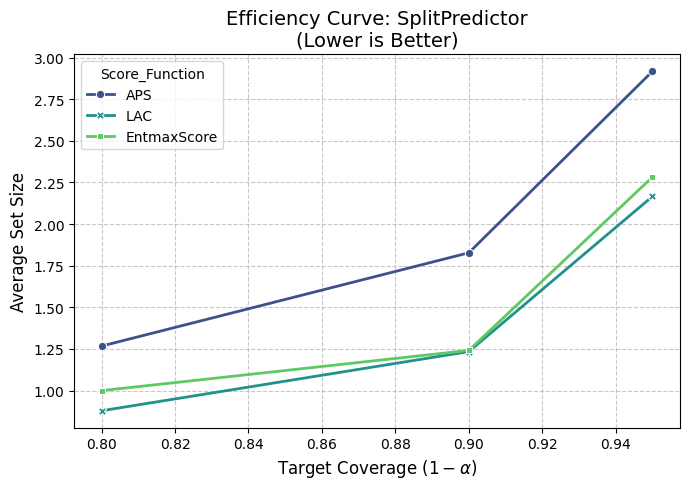

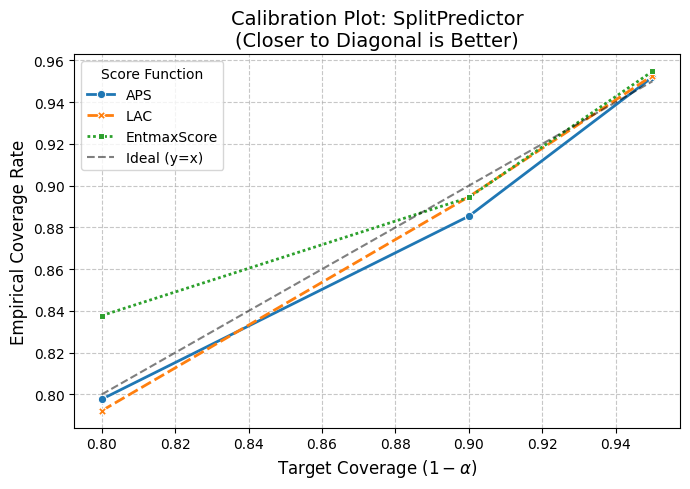

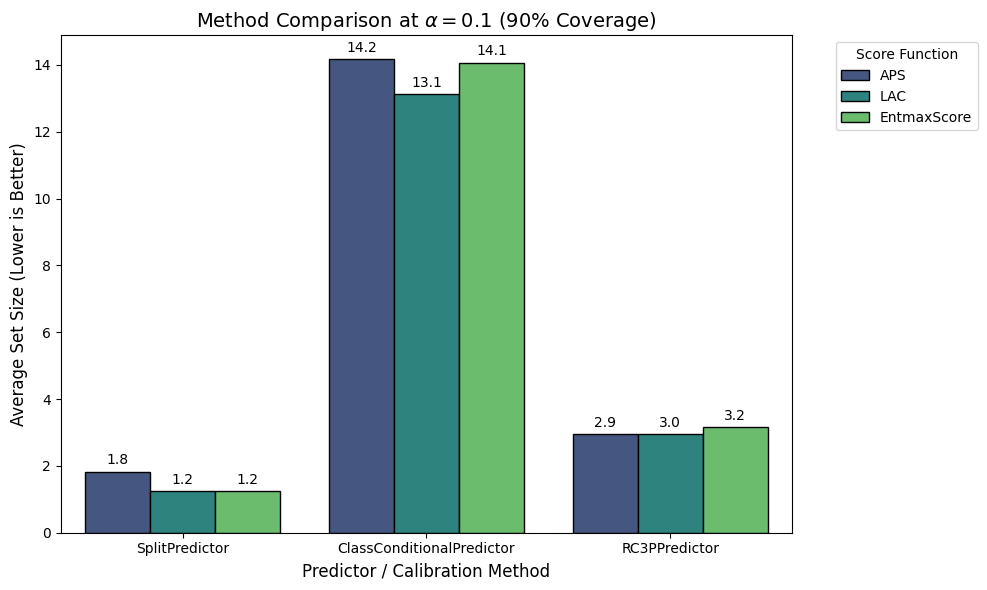

In [ ]:
df = load_and_prep_data("../results/conformal_results.csv")

plot_efficiency_curve(df, predictor_type="SplitPredictor")
plot_calibration_curve(df, predictor_type="SplitPredictor")
plot_method_comparison_bar(df, target_alpha=0.1)

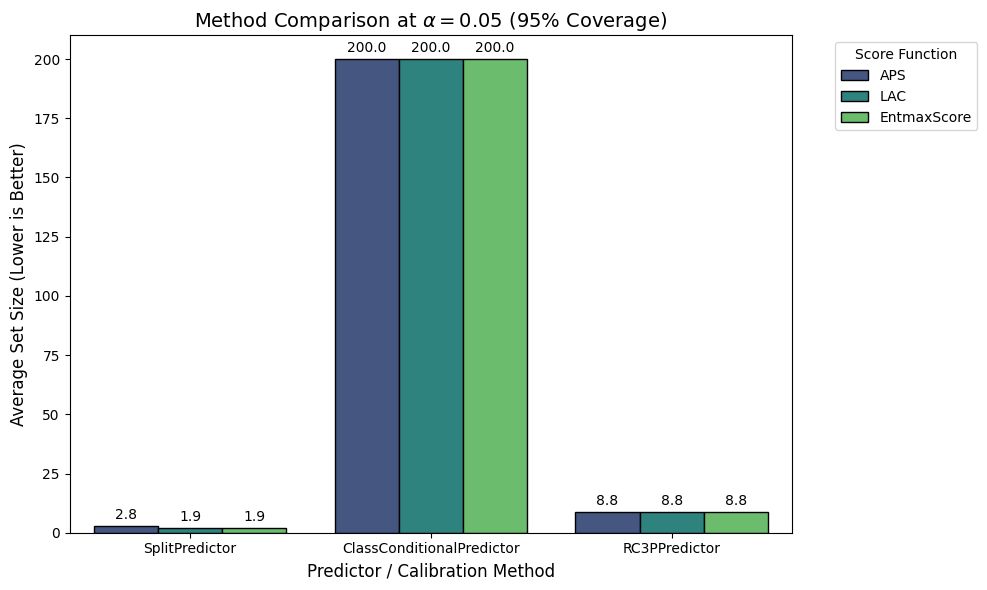

In [21]:
plot_method_comparison_bar(df, target_alpha=0.05)

#### Calibrate and Evaluate

In [49]:
predictor = get_predictor(model,SplitPredictor, EntmaxScore(), device=device)
calibrate_predictor(predictor, cal_loader, 0.05)
metrics = eval_predictor(predictor, test_loader_new)
metrics

{'coverage_rate': 0.9420089721679688, 'average_size': 1.9223334789276123}

In [50]:
pred_inds, pred_classes = get_conformal_predictions(predictor, test_dataset_new, train_dataset)
per_sample_pred_set_size_dict = get_per_sample_set_size(pred_classes)
set_size_counter = get_set_size_counter(per_sample_pred_set_size_dict)

Getting Predictions: 100%|██████████| 2897/2897 [01:06<00:00, 43.89it/s]


In [55]:
# 2. CRITICAL FIX: Disable LaTeX to prevent the crash
plt.rcParams.update({
    "text.usetex": False,
    "font.family": "serif", 
    "font.serif": ["DejaVu Serif"], # "DejaVu Serif" is a built-in safe alternative
})

<BarContainer object of 9 artists>

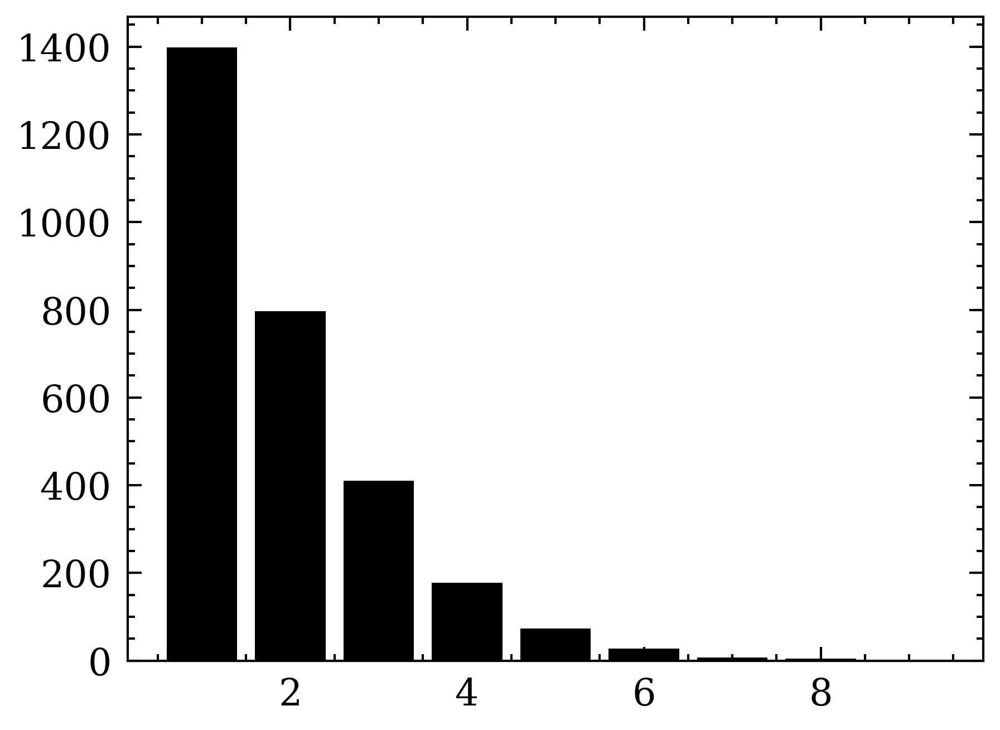

In [56]:

plt.bar(set_size_counter.keys(), set_size_counter.values())

## XAI

In [57]:
target_layer = model.model.layer4[-1] 
layer_gc = LayerGradCam(model, target_layer)
gb = GuidedBackprop(model)

Running SER Experiment on 500 samples...


100%|██████████| 500/500 [00:15<00:00, 32.62it/s]
/tmp/tmp.5jEkC7aQVQ/ipykernel_1671401/199751586.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x="set_size", y="ser", data=df_res, ax=ax[0], palette="viridis")
/tmp/tmp.5jEkC7aQVQ/ipykernel_1671401/199751586.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x="is_correct_pred", y="ser", data=df_res, ax=ax[1], palette="coolwarm")


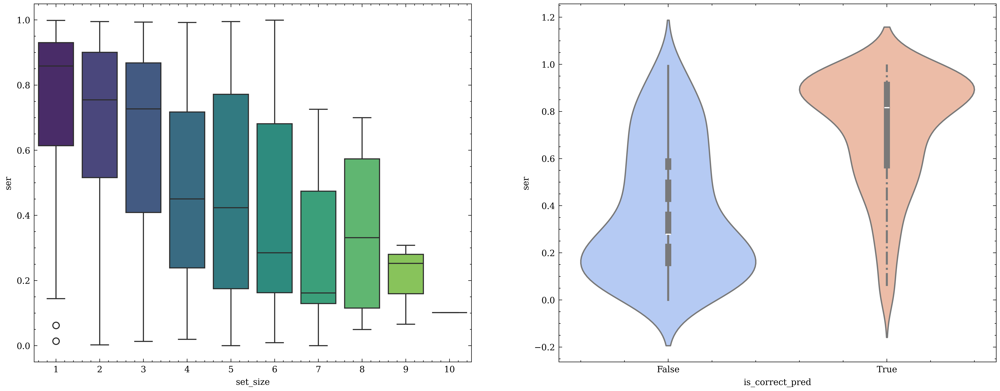

In [58]:
# ---------------------------------------------------------
# Experiment A: Semantic Grounding (SER)
# ---------------------------------------------------------
df_res = run_ser_experiment(model, exp_dataset_full, predictor, layer_gc, device, num_samples=500)

# Quick Plot inside Notebook
fig, ax = plt.subplots(1, 2, figsize=(16, 6))
sns.boxplot(x="set_size", y="ser", data=df_res, ax=ax[0], palette="viridis")
sns.violinplot(x="is_correct_pred", y="ser", data=df_res, ax=ax[1], palette="coolwarm")
plt.show()


In [59]:
# ---------------------------------------------------------
# Experiment B: Case Studies & Multi-Level Viz
# ---------------------------------------------------------
print("Scanning for interesting cases...")
candidates = {}
scan_indices = np.random.choice(len(exp_dataset_full), 2000, replace=False)

for idx in tqdm(scan_indices):
    img, label, bbox = exp_dataset_full[idx]
    input_tensor = img.unsqueeze(0).to(device)
    
    with torch.no_grad():
        pset = predictor.predict(input_tensor)
        set_size = pset.sum().item()
    
    if set_size == 1 or (3 <= set_size <= 6) or set_size > 8:
        logits = model(input_tensor)
        pred_class = logits.argmax(dim=1).item()
        attr = layer_gc.attribute(input_tensor, target=pred_class, relu_attributions=True)
        attr_map = attr.squeeze().detach().cpu().numpy()
        if len(attr_map.shape)==3: attr_map = np.mean(attr_map, axis=0)
        ser = calculate_ser_captum(attr_map, bbox, (448, 448))
        
        if "success" not in candidates and set_size == 1 and ser > 0.85:
            candidates["success"] = idx
        elif "ambiguity" not in candidates and 3 <= set_size <= 6 and ser > 0.6:
            candidates["ambiguity"] = idx
        elif "failure" not in candidates and set_size > 8 and ser < 0.25:
            candidates["failure"] = idx
            
    if len(candidates) == 3:
        break
    
if "success" in candidates:
    visualize_multi_level(candidates["success"], "Trusted Prediction", exp_dataset_full, model, predictor, layer_gc, gb, device)

if "ambiguity" in candidates:
    visualize_multi_level(candidates["ambiguity"], "Semantic Ambiguity", exp_dataset_full, model, predictor, layer_gc, gb, device)

if "failure" in candidates:
    visualize_multi_level(candidates["failure"], "Attentional Failure", exp_dataset_full, model, predictor, layer_gc, gb, device)


Scanning for interesting cases...


  0%|          | 0/2000 [00:00<?, ?it/s]

 12%|█▏        | 243/2000 [00:06<00:49, 35.23it/s]
/home/cpsc4710_us79/.local/lib/python3.10/site-packages/captum/attr/_core/guided_backprop_deconvnet.py:63: UserWarning: Input Tensor 0 did not already require gradients, required_grads has been set automatically.
  gradient_mask = apply_gradient_requirements(inputs_tuple)
/home/cpsc4710_us79/.local/lib/python3.10/site-packages/captum/attr/_core/guided_backprop_deconvnet.py:66: UserWarning: Setting backward hooks on ReLU activations.The hooks will be removed after the attribution is finished
  warnings.warn(


Saved multilevel plot: Trusted Prediction


/home/cpsc4710_us79/.local/lib/python3.10/site-packages/captum/attr/_core/guided_backprop_deconvnet.py:63: UserWarning: Input Tensor 0 did not already require gradients, required_grads has been set automatically.
  gradient_mask = apply_gradient_requirements(inputs_tuple)
/home/cpsc4710_us79/.local/lib/python3.10/site-packages/captum/attr/_core/guided_backprop_deconvnet.py:66: UserWarning: Setting backward hooks on ReLU activations.The hooks will be removed after the attribution is finished
  warnings.warn(


Saved multilevel plot: Semantic Ambiguity


/home/cpsc4710_us79/.local/lib/python3.10/site-packages/captum/attr/_core/guided_backprop_deconvnet.py:63: UserWarning: Input Tensor 0 did not already require gradients, required_grads has been set automatically.
  gradient_mask = apply_gradient_requirements(inputs_tuple)
/home/cpsc4710_us79/.local/lib/python3.10/site-packages/captum/attr/_core/guided_backprop_deconvnet.py:66: UserWarning: Setting backward hooks on ReLU activations.The hooks will be removed after the attribution is finished
  warnings.warn(


Saved multilevel plot: Attentional Failure


In [60]:
# ---------------------------------------------------------
# Experiment C: Baselines
# ---------------------------------------------------------
exp_loader = DataLoader(exp_dataset_full, batch_size=1, shuffle=False)
pt_acc, naive_k, conf_size = evaluate_baselines(model, exp_loader, layer_gc, predictor, device)

print(f"Pointing Game: {pt_acc}")
print(f"Naive K: {naive_k}")
print(f"CP Size: {conf_size}")


Evaluating Baselines...


100%|██████████| 5794/5794 [02:56<00:00, 32.88it/s]

Pointing Game: 0.7204004142216086
Naive K: 30
CP Size: 3.2896099413186053


Evaluating Class-Conditional Coverage...


100%|██████████| 46/46 [01:01<00:00,  1.33s/it]


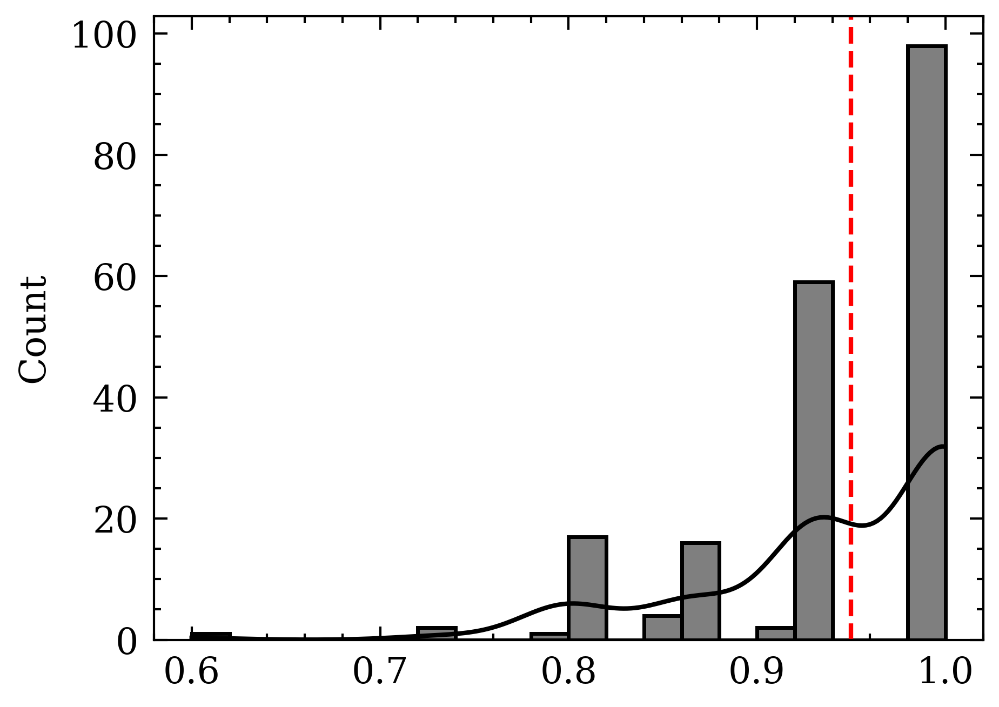

In [61]:
# ---------------------------------------------------------
# Experiment D: Safety (Class Coverage)
# ---------------------------------------------------------
scores = evaluate_class_coverage(predictor, test_loader_new, device)
sns.histplot(scores, bins=20, kde=True)
plt.axvline(0.95, color='r', linestyle='--')
plt.show()

In [62]:
from vis_utils import visualize_prediction_set


Scanning for Case: Confusion: CA Gull vs Western Gull...


 44%|████▍     | 1283/2897 [00:28<00:35, 44.96it/s]


  -> Found example at Index 2410
Prediction Set Size: 3
Candidates: ['California_Gull', 'Glaucous_winged_Gull', 'Western_Gull']


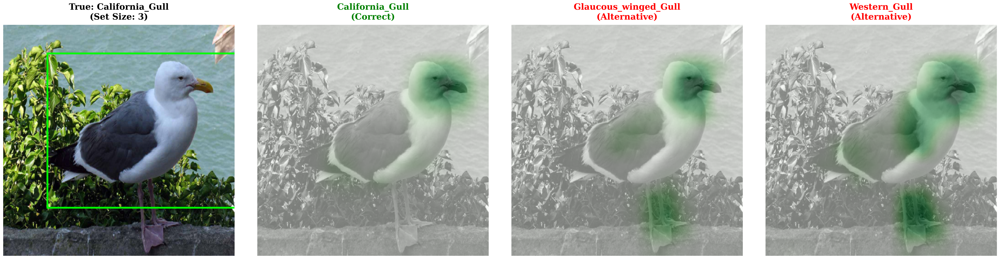


Scanning for Case: Confusion: Caspian Tern vs Elegant Tern...


  6%|▌         | 169/2897 [00:03<01:01, 44.22it/s]


  -> Found example at Index 213
Prediction Set Size: 4
Candidates: ['Caspian_Tern', 'Common_Tern', 'Elegant_Tern', 'Forsters_Tern']


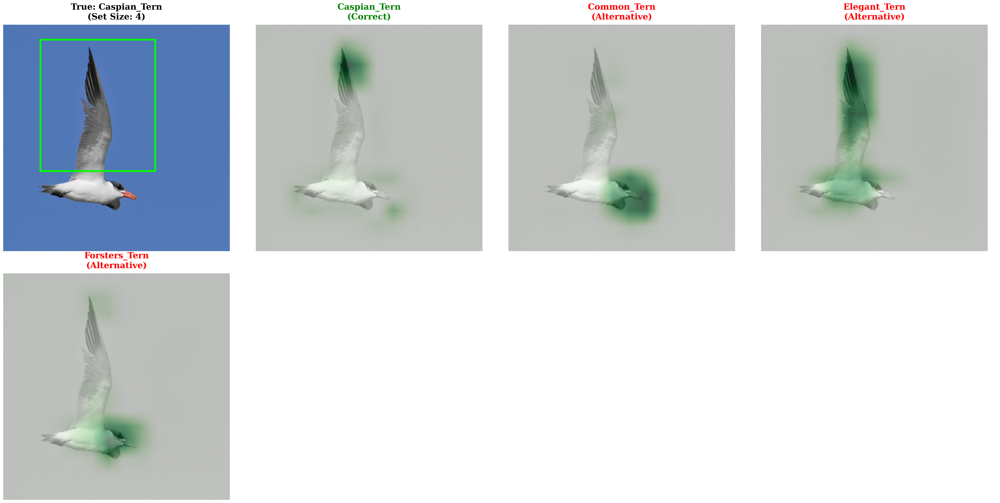


Scanning for Case: Epistemic Failure (Large Set)...


  3%|▎         | 80/2897 [00:01<01:06, 42.40it/s]


  -> Found example at Index 2564
Prediction Set Size: 10
Candidates: ['Groove_billed_Ani', 'Rusty_Blackbird', 'Indigo_Bunting', 'Bronzed_Cowbird', 'Northern_Flicker', 'Pine_Grosbeak', 'Whip_poor_Will', 'White_necked_Raven', 'Pileated_Woodpecker', 'Red_headed_Woodpecker']



Scanning for Case: Trusted Prediction (Baseline)...


  0%|          | 14/2897 [00:00<02:02, 23.55it/s]


  -> Found example at Index 904
Prediction Set Size: 1
Candidates: ['Prothonotary_Warbler']


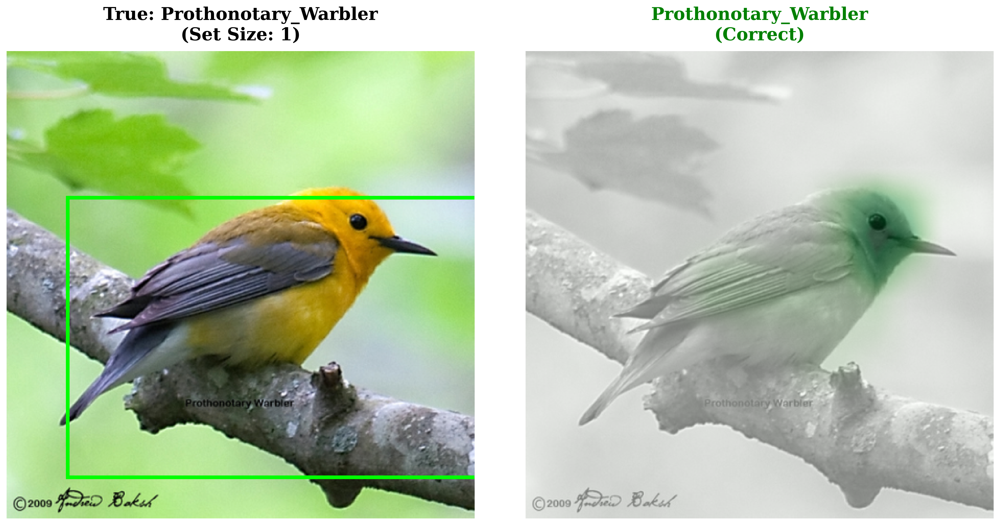

In [ ]:
import torch
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import cv2
import math
from tqdm.auto import tqdm
from torchvision import transforms
from captum.attr import visualization as viz


MEAN = [0.485, 0.456, 0.406]
STD = [0.229, 0.224, 0.225]

def visualize_prediction_set(index, dataset, model, predictor, layer_gc, device, class_names):
    """
    Visualizes the GradCAM explanation for EVERY class in the Conformal Prediction Set.
    Automatically un-normalizes images for correct color plotting.
    """
    # 1. Load Data
    img, label, bbox = dataset[index]
    input_tensor = img.unsqueeze(0).to(device)
    
    # 2. Get Conformal Prediction Set
    with torch.no_grad():
        prediction_set = predictor.predict(input_tensor)
        candidate_indices = torch.nonzero(prediction_set.flatten()).flatten().cpu().numpy()
        
    set_size = len(candidate_indices)
    print(f"Prediction Set Size: {set_size}")
    print(f"Candidates: {[class_names[i] for i in candidate_indices]}")
    
    # 3. Setup Plotting Grid
    cols = min(set_size + 1, 4)
    rows = math.ceil((set_size + 1) / cols)
    
    fig, axes = plt.subplots(rows, cols, figsize=(4*cols, 4*rows))
    if isinstance(axes, np.ndarray): axes = axes.flatten()
    else: axes = [axes]
    
    # 4. Plot Original Image (Un-normalized)
    inv_normalize = transforms.Normalize(
        mean=[-m/s for m, s in zip(MEAN, STD)],
        std=[1/s for s in STD]
    )
    img_disp = inv_normalize(img).permute(1, 2, 0).numpy()
    img_disp = np.clip(img_disp, 0, 1)
    
    axes[0].imshow(img_disp)
    rect = patches.Rectangle((bbox[0], bbox[1]), bbox[2], bbox[3], linewidth=2, edgecolor='lime', facecolor='none')
    axes[0].add_patch(rect)
    axes[0].set_title(f"True: {class_names[label]}\n(Set Size: {set_size})", fontweight='bold')
    axes[0].axis('off')
    
    # 5. Loop through Candidates
    for i, class_idx in enumerate(candidate_indices):
        ax_idx = i + 1
        if ax_idx >= len(axes): break
        
        # Generate GradCAM for candidate
        attr = layer_gc.attribute(input_tensor, target=int(class_idx), relu_attributions=True)
        attr = attr.squeeze().detach().cpu().numpy()
        if len(attr.shape) == 3: attr = np.mean(attr, axis=0)
        
        heatmap_resized = cv2.resize(attr, (448, 448))
        
        viz.visualize_image_attr(
            np.expand_dims(heatmap_resized, 2), 
            img_disp, 
            method="blended_heat_map", 
            sign="positive", 
            show_colorbar=False, 
            plt_fig_axis=(fig, axes[ax_idx]),
            use_pyplot=False
        )
        
        is_gt = (class_idx == label)
        color = 'green' if is_gt else 'red'
        name = class_names[class_idx]
        axes[ax_idx].set_title(f"{name}\n({'Correct' if is_gt else 'Alternative'})", color=color, fontweight='bold')
        axes[ax_idx].axis('off')

    # Cleanup unused axes
    for j in range(set_size + 1, len(axes)):
        axes[j].axis('off')
        
    plt.tight_layout()
    plt.show()

def get_class_idx(name_part, class_names):
    """Finds the index of a class given a partial name."""
    if isinstance(class_names, dict):
        for k, v in class_names.items():
            if name_part in v: return k
    else:
        for i, v in enumerate(class_names):
            if name_part in v: return i
    return None

def find_and_plot_specific_case(dataset, model, predictor, layer_gc, device, class_names, condition_name, search_fn):
    print(f"\nScanning for Case: {condition_name}...")
    found_idx = None
    indices = np.random.permutation(len(dataset))
    
    for idx in tqdm(indices):
        img, label, _ = dataset[idx]
        input_tensor = img.unsqueeze(0).to(device)
        
        with torch.no_grad():
            pset = predictor.predict(input_tensor)
            candidates = torch.nonzero(pset.flatten()).flatten().cpu().numpy()
            
        if search_fn(label, candidates, len(candidates)):
            found_idx = idx
            break
            
    if found_idx is not None:
        print(f"  -> Found example at Index {found_idx}")
        visualize_prediction_set(found_idx, dataset, model, predictor, layer_gc, device, class_names)
    else:
        print("  -> No example found in scan limit.")

# ==========================================
# Run the Case Studies
# ==========================================

# Indices for specific confusions
idx_ca_gull = get_class_idx("California_Gull", class_names)
idx_we_gull = get_class_idx("Western_Gull", class_names)
idx_ca_tern = get_class_idx("Caspian_Tern", class_names)
idx_el_tern = get_class_idx("Elegant_Tern", class_names)

# 1. Confusion: Gull vs Gull
find_and_plot_specific_case(
    exp_dataset_new, model, predictor, layer_gc, device, class_names,
    condition_name="Confusion: CA Gull vs Western Gull",
    search_fn=lambda label, cands, size: (label == idx_ca_gull) and (idx_we_gull in cands)
)

# 2. Confusion: Tern vs Tern
find_and_plot_specific_case(
    exp_dataset_new, model, predictor, layer_gc, device, class_names,
    condition_name="Confusion: Caspian Tern vs Elegant Tern",
    search_fn=lambda label, cands, size: (label == idx_ca_tern) and (idx_el_tern in cands)
)

# 3. Epistemic Failure (Large Set)
find_and_plot_specific_case(
    exp_dataset_new, model, predictor, layer_gc, device, class_names,
    condition_name="Epistemic Failure (Large Set)",
    search_fn=lambda label, cands, size: 10 <= size <= 20
)

# 4. Trusted Prediction (Control)
# Fixed: changed size == 3 to size == 1 for a true "Trusted" baseline
find_and_plot_specific_case(
    exp_dataset_new, model, predictor, layer_gc, device, class_names,
    condition_name="Trusted Prediction (Baseline)",
    search_fn=lambda label, cands, size: (size == 1) and (label in cands)
)